In [65]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [66]:
from collections.abc import Callable, Iterator
from math import pi
from typing import Any

import equinox as eqx
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import optax
from einops import einsum, repeat
from equinox.nn import Linear
from jaxtyping import Array, ArrayLike, Float
from tqdm.auto import tqdm

from sciml.plotting import plot_solution, plot_wavefront_1d
from sciml.psuedospectral import BurgersSolver

jax.config.update("jax_enable_x64", True)

ActivationFunction = Callable[[Float[Array, "... dim"]], Float[Array, "... dim"]]
Key = ArrayLike


# Controlling Randomness

In JAX, randomness is controlled _locally_ by splitting a mother RNG key

In [67]:
key = jax.random.key(42)
data_key, model_key, train_key = jax.random.split(key, num=3)

# Data Generation

We will generate data from Burgers equation, recall this is a spatiotemporal (1+1)-D nonlinear PDE, that exhibits shock formation.

In [68]:
solver = BurgersSolver(N=256, nu=1e-3)
xs = solver.domain

# random fourier series as an initial condition
ic_modes = 10
freqs_key, amps_key = jax.random.split(data_key, num=2)
freqs = (5 * pi / solver.L) * jax.random.uniform(freqs_key, shape=(ic_modes,), minval=0.0, maxval=2)
freqs = jnp.sort(freqs)
amplitudes = jax.random.exponential(amps_key, shape=(ic_modes,)) * 0.1
amplitudes = jnp.sort(amplitudes, descending=True)


def initial_condition(xs: Float[Array, " N"]) -> Float[Array, " N"]:
    freq_grid = einsum(freqs, solver.domain, "modes, N ... -> modes N ...")
    ic = einsum(amplitudes, jnp.cos(freq_grid), "modes, modes N ... -> N ...")
    return ic


ic = initial_condition(solver.domain)

# generate training data
num_timepoints = 1024
tspan = [0, 10]
ic_k = solver.to_fourier(ic)
ts, uks = solver.integrate(ic_k, tspan, num_save_pts=num_timepoints)
us = solver.to_spatial(uks)

100.00%|██████████| [00:00<00:00, 155.50%/s]


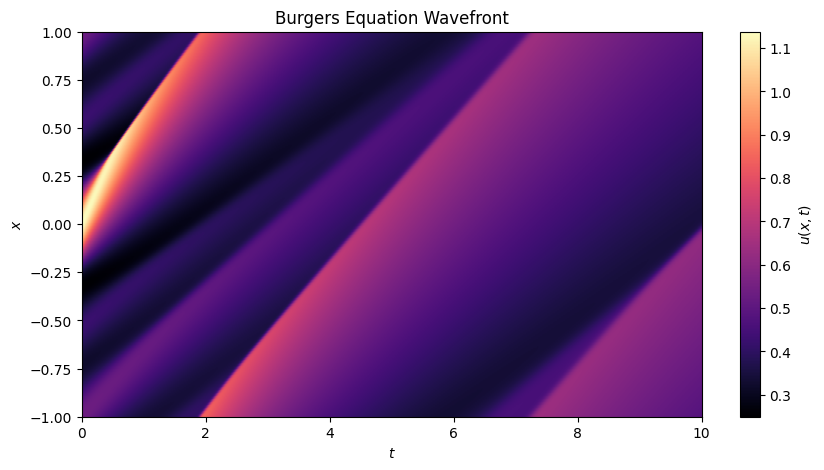

In [69]:
plot_solution(us, tspan, solver.bounds, title="Burgers Equation Wavefront")

In [70]:
plot_wavefront_1d(ts[:400], solver.domain, us[:400], solver.bounds)

# PINN

We will instantiate the PINN as a composition of gated feed-forward networks (GatedFFNs) which internally use gated linear units with a Swish activation function.

We will also ignore bias terms.

In [71]:
def swish(x: Float[Array, "... dim"]) -> Float[Array, "... dim"]:
    return x / (1 + jnp.exp(-x))


class GatedFFN(eqx.Module):
    up_projection: Linear
    gate: Linear
    down_projection: Linear
    activation_fn: ActivationFunction

    def __init__(self, d_model: int, d_ff: int, activation_fn: ActivationFunction, key: Key) -> "GatedFFN":
        up_proj_rng, down_proj_rng, gate_rng = jax.random.split(key, num=3)
        self.up_projection = Linear(d_model, d_ff, use_bias=False, key=up_proj_rng)
        self.gate = Linear(d_model, d_ff, use_bias=False, key=gate_rng)
        self.down_projection = Linear(d_ff, d_model, use_bias=False, key=down_proj_rng)
        self.activation_fn = activation_fn

    def __call__(self, x: Float[Array, "... d_model"]) -> Float[Array, "... d_model"]:
        hidden_feats = self.up_projection(x)
        scores = self.gate(x)
        gate = self.activation_fn(scores)
        return self.down_projection(gate * hidden_feats)


class SpatiotemporalPINN(eqx.Module):
    input_projection: Linear
    layers: list[GatedFFN]
    output_projection: Linear

    def __init__(
        self,
        in_dim: int,
        n_layers: int,
        d_model: int,
        key: Key,
        activation_fn: ActivationFunction = swish,
    ) -> "SpatiotemporalPINN":
        input_proj_rng, output_proj_rng, *hiddens_rng = jax.random.split(key, num=2 + n_layers)
        self.input_projection = Linear(1 + in_dim, d_model, use_bias=False, key=input_proj_rng)
        self.layers = [GatedFFN(d_model, 2 * d_model, activation_fn, rng) for rng in hiddens_rng]
        self.output_projection = Linear(d_model, 1, use_bias=False, key=output_proj_rng)

    def __call__(self, t: Float[Array, ""], x: Float[Array, "... in_dim"]) -> Float[Array, "... out_dim"]:
        tx = jnp.concat([t, x])
        hidden_feats = self.input_projection(tx)
        for ffn in self.layers:
            hidden_feats = ffn(hidden_feats)
        return self.output_projection(hidden_feats)


# Training

We will now define the dataloader, loss function, and training step function

In [72]:
import numpy as np


def dataloader(ts: Float[Array, "..."], xs: Float[Array, "..."], batch_size: int) -> Iterator[tuple]:
    ts_broadcasted = repeat(ts, "T -> T N", N=xs.shape[0])
    xs_broadcasted = repeat(xs, "N -> T N", T=ts.shape[0])
    grid = jnp.stack([ts_broadcasted, xs_broadcasted], axis=0).reshape(2, -1, 1)
    total = grid.shape[1]
    grid_indices = np.arange(total)
    while True:
        perm = np.random.permutation(grid_indices)
        start = 0
        end = batch_size
        while end <= total:
            batch_indices = perm[start:end]
            t_batch, x_batch = grid[:, batch_indices, :]
            yield t_batch, x_batch
            start = end
            end = start + batch_size

In [73]:
@eqx.filter_value_and_grad(has_aux=True)
def burgers_loss(
    model: eqx.Module, t: Float[Array, "batch_size 1"], x: Float[Array, "batch_size 1"]
) -> tuple[Float[Array, ""], dict[str, Float[Array, ""]]]:
    batched_model = jax.vmap(model)
    u_pred = batched_model(t, x)

    grad_fn = jax.grad(lambda t, x: model(t, x).squeeze(), argnums=(0, 1))
    u_pred_t, u_pred_x = jax.vmap(grad_fn)(t, x)

    laplace_fn = jax.grad(lambda t, x: grad_fn(t, x)[1].squeeze(), argnums=1)
    u_pred_xx = jax.vmap(laplace_fn)(t, x)

    # physics informed loss term
    pde_residual = u_pred_t + u_pred * u_pred_x - solver.nu * u_pred_xx
    pde_loss = (pde_residual * pde_residual).mean()

    # boundary loss term
    left_u_pred = batched_model(t, solver.bounds[0] * jnp.ones_like(x))
    right_u_pred = batched_model(t, solver.bounds[1] * jnp.ones_like(x))
    boundary_error = left_u_pred - right_u_pred
    boundary_loss = (boundary_error * boundary_error).mean()

    # initial condition loss term
    init_u_pred = batched_model(jnp.zeros_like(t), x)
    init_u = initial_condition(x)
    ic_error = init_u - init_u_pred
    ic_loss = (ic_error * ic_error).mean()

    total_loss = ic_loss + boundary_loss + pde_loss
    aux = {"ic_loss": ic_loss, "boundary_loss": boundary_loss, "pde_loss": pde_loss}
    return total_loss, aux


We will train on the full spatial extent, but only on half of the time domain. This will be so we can evaluate the final model in distribution (ID) and out of distribution (OOD)

In [81]:
from collections import defaultdict

# initialize the dataloader
batch_size = 64
loader = dataloader(ts[: ts.shape[0] // 2], solver.domain, batch_size)

# initialize the model
pinn = SpatiotemporalPINN(1, n_layers=4, d_model=64, key=model_key)

# define the optimizer and step function
optimizer = optax.adamw(learning_rate=1e-4, weight_decay=1e-4)
opt_state = optimizer.init(eqx.filter(pinn, eqx.is_array))


@eqx.filter_jit
def step_fn(
    model: eqx.Module, t: Float[Array, "batch_size 1"], x: Float[Array, "batch_size 1"], opt_state: Any
) -> tuple[Float[Array, ""], dict[str, Float[Array, ""]], eqx.Module, Any]:
    (loss, aux), grads = burgers_loss(model, t, x)
    updates, opt_state = optimizer.update(grads, opt_state, eqx.filter(model, eqx.is_array))
    model = eqx.apply_updates(model, updates)
    return loss, aux, model, opt_state


# training loop
losses = defaultdict(list)
iters = 1500
with tqdm(total=iters, desc="Training") as pbar:
    for i in range(iters):
        t, x = next(loader)
        loss, aux, pinn, opt_state = step_fn(pinn, t, x, opt_state)
        loss = loss.item()
        ic = aux["ic_loss"].item()
        bd = aux["boundary_loss"].item()
        pde = aux["pde_loss"].item()
        pbar.set_postfix_str(
            f"Step: {i:4d} | IC Loss: {ic:.5f} | BC Loss: {bd:.5f} | PDE Loss: {pde:.5f} | Total Loss: {loss:.5f}"
        )
        pbar.update(1)

        # log the losses
        losses["IC Loss"].append(ic)
        losses["BC Loss"].append(bd)
        losses["PDE Loss"].append(pde)
        losses["Total Loss"].append(loss)


Training:   0%|          | 0/1500 [00:00<?, ?it/s]

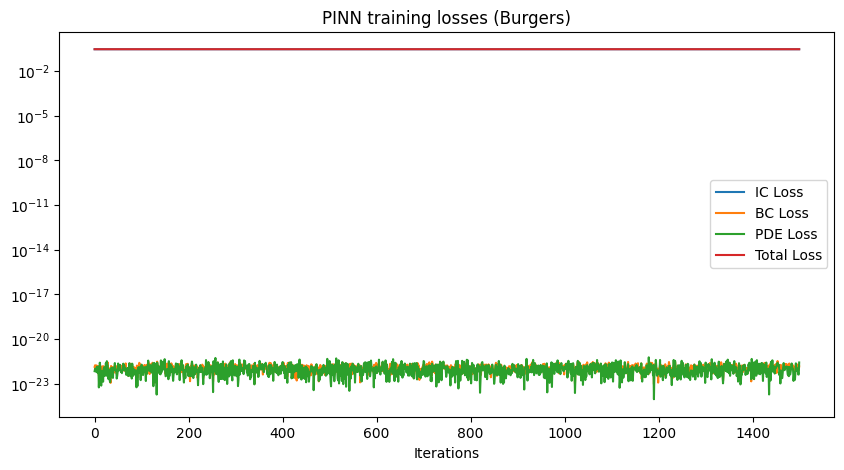

In [82]:
plt.figure(figsize=(10, 5))
plt.title("PINN training losses (Burgers)")
for key, loss in losses.items():
    plt.plot(np.arange(iters), loss, label=key)
    plt.xlabel("Iterations")
    plt.semilogy()
plt.legend();

# Evaluation

Undoubtedly the most important piece of pipeline. We will evaluate the pointwise error ID and OOD and plot the error

In [83]:
def nrmse(y_true: Float[Array, "..."], y_pred: Float[Array, "..."]) -> Float[Array, ""]:
    rmse = jnp.sqrt(jnp.mean((y_pred - y_true) ** 2))
    denom = jnp.std(y_true) + 1e-12
    return rmse / denom

NRMSE (in-distribution):  3.30107
NRMSE (out-of-distribution): 5.36625


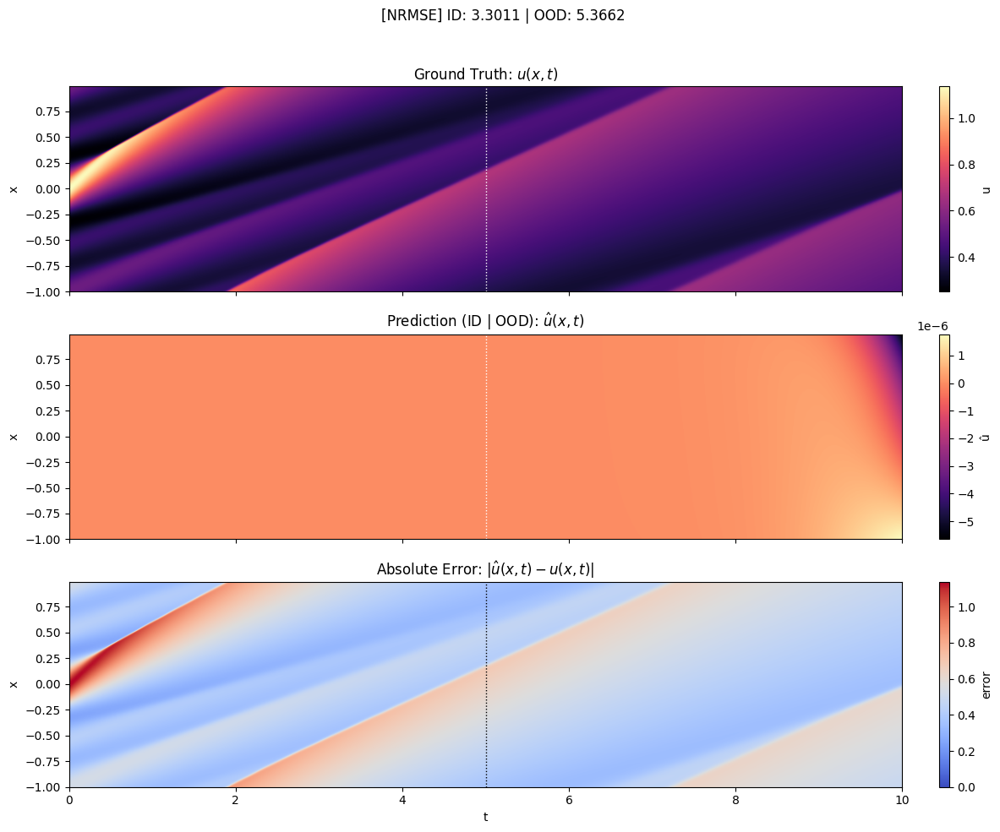

In [ ]:
# evaluation: full-grid prediction
T, N = ts.shape[0], solver.domain.shape[0]
t_grid = repeat(ts, "T -> T N 1", N=N)
x_grid = repeat(xs, "N -> T N 1", T=T)
t_flat = t_grid.reshape(-1, 1)
x_flat = x_grid.reshape(-1, 1)
pred_flat = jax.vmap(lambda ti, xi: pinn(ti, xi).squeeze())(t_flat, x_flat)
u_pred = pred_flat.reshape(T, N)

split_idx = T // 2
nrmse_id = nrmse(us[:split_idx], u_pred[:split_idx])
nrmse_ood = nrmse(us[split_idx:], u_pred[split_idx:])
print(f"NRMSE (in-distribution):  {float(nrmse_id):.5f}")
print(f"NRMSE (out-of-distribution): {float(nrmse_ood):.5f}")

# plots: GT, prediction, error (stacked, shared x-axis)
extent = [float(ts[0]), float(ts[-1]), float(xs[0]), float(xs[-1])]
t_split = float(ts[split_idx])

fig, (ax_gt, ax_pred, ax_err) = plt.subplots(3, 1, figsize=(12, 10), sharex=True)

im0 = ax_gt.imshow(us.T, aspect="auto", origin="lower", extent=extent, cmap="magma")
ax_gt.axvline(t_split, color="w", linestyle=":", linewidth=1.0)
ax_gt.set_title(r"Ground Truth: $u(x,t)$")
ax_gt.set_ylabel("x")
cbar0 = fig.colorbar(im0, ax=ax_gt, fraction=0.046, pad=0.04)
cbar0.set_label("u")

im1 = ax_pred.imshow(u_pred.T, aspect="auto", origin="lower", extent=extent, cmap="magma")
ax_pred.axvline(t_split, color="w", linestyle=":", linewidth=1.0)
ax_pred.set_title(r"Prediction (ID | OOD): $\hat{u}(x,t)$")
ax_pred.set_ylabel("x")
cbar1 = fig.colorbar(im1, ax=ax_pred, fraction=0.046, pad=0.04)
cbar1.set_label("û")

err = u_pred - us
vmax = float(jnp.max(jnp.abs(err)))
im2 = ax_err.imshow(err.T, aspect="auto", origin="lower", extent=extent, cmap="coolwarm", vmin=0.0, vmax=vmax)
ax_err.axvline(t_split, color="k", linestyle=":", linewidth=1.0)
ax_err.set_title(r"Absolute Error: $|\hat{u}(x,t) - u(x,t)|$")
ax_err.set_xlabel("t")
ax_err.set_ylabel("x")
cbar2 = fig.colorbar(im2, ax=ax_err, fraction=0.046, pad=0.04)
cbar2.set_label("error")

fig.suptitle(
    f"[NRMSE] ID: {float(nrmse_id):.4f} | OOD: {float(nrmse_ood):.4f}",
    y=0.98,
    fontsize=12,
)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()
